# Testing weighted VMF models

This jupyter notebook is to test the ability of weighted VMF model compared to other emission models when fitting the functional task-evoked data.

<br>

## Emission models description

### 1. von-Mises Fisher Mixture model (VMF)

For a $N$-dimensional data $\mathbf{y} (||\mathbf{y}||_2=1) $ the probability density function of von Mises-Fisher distribution is defined as following,

$$
V_N(\mathbf{y}|\mathbf{v}_k,\kappa) = C_N(\kappa)exp(\kappa\mathbf{v}_k^{T}\mathbf{y})
$$

where $\mathbf{v}_k$ denotes the mean direction (unit vectors for each parcels), $\kappa$ indicates the concentration parameter ($\kappa\geqslant0$), which is joint over all parcels. $C_N(\kappa) = \frac{\kappa^{N/2-1}}{(2\pi)^{N/2}I_{N/2-1}(\kappa)}$ is the normalization constant where $I_r(.)$ refers to the modified Bessel function of the $r$ order. 

Now, we update the parameters $\theta$ of the von-Mises mixture in the $M$ step by maximizing $\mathcal{L}_E$  in respect to the parameters in von-Mises mixture $\theta_{k}=\{\mathbf{v}_{k},\kappa\}$. (Note: the updates only consider a single subject).

<br>

### 2. weighted von-Mises Fisher Mixture model (wVMF)

For a $N$-dimensional data $\mathbf{y} (||\mathbf{y}||_2=1) $ the probability density function of von Mises-Fisher distribution is defined as following,

$$
V_N(\mathbf{y}|\mathbf{v}_k,\kappa) = C_N(\kappa)exp(\kappa w\mathbf{v}_k^{T}\mathbf{y})
$$

where the only difference compared to original VMF mixture is that we added a weight factor $w$ in the pdf to weight the data likelihood. In this case, $w$ is simulated as the signal strength of the data points so that the the likelihood would be emphasised toward to the data points with large signal, while the loglikelihood of those small signal points will be panalized by $w$.

<br>

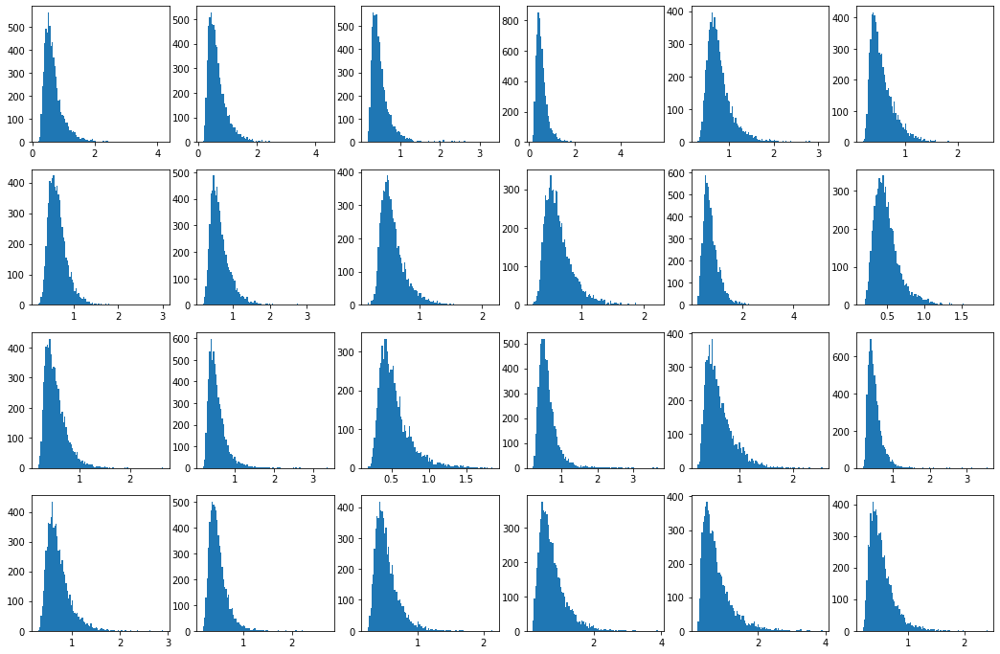

0.19836833945320556 3.2018406752152244


In [2]:
import os
import sys 
sys.path.append(os.path.abspath('..'))
from scripts.learn_mdtb import learn_single, get_mdtb_data
import matplotlib.pyplot as plt
import torch as pt
import numpy as np

Data, Xdesign, D = get_mdtb_data('ses-s1')
Y = np.linalg.norm(Data, axis=1)

plt.figure(figsize=(18,12))
for i in range(24):
    plt.subplot(4, 6, i+1)
    plt.hist(Y[i], bins=100)

plt.show()
print(np.nanmin(Y, axis=1).mean(), np.nanmax(Y, axis=1).mean())

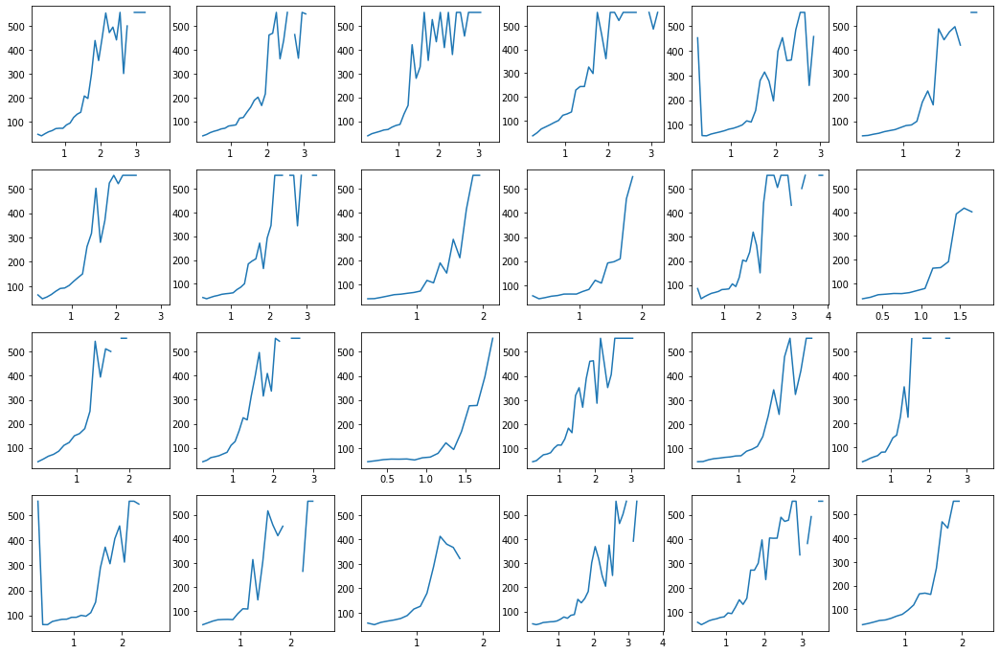

In [7]:
kappas = []
plt.figure(figsize=(18,12))
for i in range(24):
    this_kappa = learn_single(sub_id=i)
    kappas.append(pt.tensor(this_kappa))
    plt.subplot(4, 6, i+1)
    plt.plot(np.arange(0.2,4,0.1)[:-1]+0.05, pt.stack(this_kappa))

# plt.ylim(0, 2500)
plt.show()

**Conclusion**: As we can see in the figure - we fist fit a original VMF mixture model on the real data so that we get k mean direction vector $V_k$ and concentration parameter $\kappa$. Then we use it to infer on the data points binned by its magnitude. By the first simulation we know that the mean min/max data magnitude is ~(0.2, 3.2), we then set a range from \[0.2, 4\] with step 0.1. 

**Null hypothesis**: if the noise are all comes from the concentration $\kappa$, then the inferred $\kappa$ will be constant across different magnitude. 

However, the second figure shows that the $\kappa$ increase exponentially with the data magnitude which means the data with large signal have less variance in terms of the mean direction (more concentrated). This is contradicting our hypothesis - as the noise are not all comes from the $\kappa$ (spread on the hypersphere aroud the mean direction) but also from the direction along the signal magnitude.

In [3]:
import generativeMRF.arrangements as ar
import generativeMRF.emissions as em
import generativeMRF.full_model as fm
import generativeMRF.evaluation as ev
import seaborn as sb
import torch as pt

K=4
P=5000
N=3
num_sub=1
arrange = ar.ArrangeIndependent(K=K, P=P, spatial_specific=False, remove_redundancy=False)


emissionGMM = em.MixGaussian(K=K, N=N, P=P)
emissionGMM.sigma2 = pt.tensor(0.1)
emissionGME = em.MixGaussianExp(K=K,N=N,P=P, std_V=True)
emissionGME.sigma2 = pt.tensor(0.01)
emissionGME.beta = pt.tensor(2.0)
emissionVMF = em.MixVMF(K=K,N=N,P=P)
emissionVMF.kappa = pt.tensor(18)
emissionwVMF = em.wMixVMF(K=K,N=N,P=P)
emissionwVMF.kappa = pt.tensor(18)

# signal strength from an exponential distribution
signal_exp = pt.distributions.exponential.Exponential(1.5).sample((num_sub, 1, P))

# Signal strength from a fake exp (catagorical) distribution for simplicity
W = pt.tensor([0.4, 0.6, 0.8, 1, 2, 4])
a = pt.distributions.categorical.Categorical(pt.tensor([0.25, 0.3, 0.25, 0.14, 0.05, 0.01])).sample((num_sub, P))
signal_cat = W[a.long()].unsqueeze(1)



## Generate data from the true models

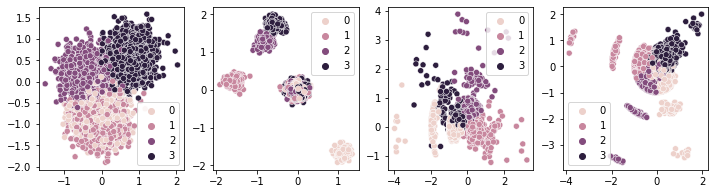

In [4]:
# Step 1: Generate data by sampling from the above model
U = arrange.sample(num_subj=1)
Y1 = emissionGMM.sample(U)
Y2 = emissionGME.sample(U)
Y3 = emissionVMF.sample(U) * signal_cat # VMF data plus signal strength
Y4 = emissionwVMF.sample(U)
Y=[]
Y.append(Y1)
Y.append(Y2)
Y.append(Y3)
Y.append(Y4)

plt.figure(figsize=(12,3))
for i in range(4): 
    plt.subplot(1,4,i+1)
    sb.scatterplot(x=Y[i][0,0,:],y=Y[i][0,1,:],hue=U[0]) 

## Check the signal strength distribution from the generated data

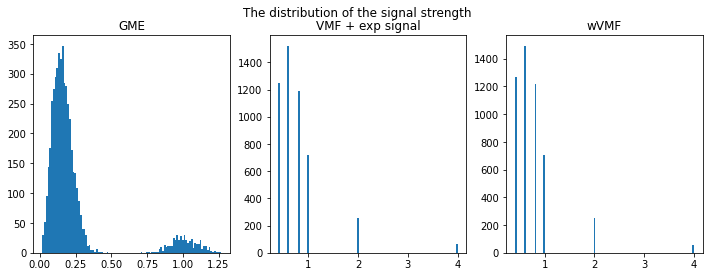

In [15]:
plt.figure(figsize=(12,4))
plt.subplot(131)
plt.hist(pt.norm(Y2, dim=1).reshape(-1).numpy(), bins=100)
plt.title('GME')
plt.subplot(132)
plt.hist(pt.norm(Y3, dim=1).reshape(-1).numpy(), bins=100)
plt.title('VMF + exp signal')
plt.subplot(133)
plt.hist(pt.norm(Y4, dim=1).reshape(-1).numpy(), bins=100)
plt.title('wVMF')

plt.suptitle('The distribution of the signal strength')
plt.show()

In [5]:
sys.path.append(os.path.abspath('..'))
import plotly.graph_objects as go
from plotly.subplots import make_subplots

fig = make_subplots(rows=1, cols=3, specs=[[{'type': 'surface'}, {'type': 'surface'}, {'type': 'surface'}]],
                    subplot_titles=["GME", "VMF", "wVMF"])

# fig.add_trace(go.Scatter3d(x=Y1[0, 0, :], y=Y1[0, 1, :], z=Y1[0, 2, :],
#                            mode='markers', marker=dict(size=3, opacity=0.7, color=U[0])), row=1, col=1)
fig.add_trace(go.Scatter3d(x=Y2[0, 0, :], y=Y2[0, 1, :], z=Y2[0, 2, :],
                           mode='markers', marker=dict(size=3, opacity=0.7, color=U[0])), row=1, col=1)
fig.add_trace(go.Scatter3d(x=Y3[0, 0, :], y=Y3[0, 1, :], z=Y3[0, 2, :],
                           mode='markers', marker=dict(size=3, opacity=0.7, color=U[0])), row=1, col=2)
fig.add_trace(go.Scatter3d(x=Y4[0, 0, :], y=Y4[0, 1, :], z=Y4[0, 2, :],
                           mode='markers', marker=dict(size=3, opacity=0.7, color=U[0])), row=1, col=3)

fig.update_layout(title_text='Visualization of data generation')
fig.show()

### Simulation when kappa = 30 and 1000 data points

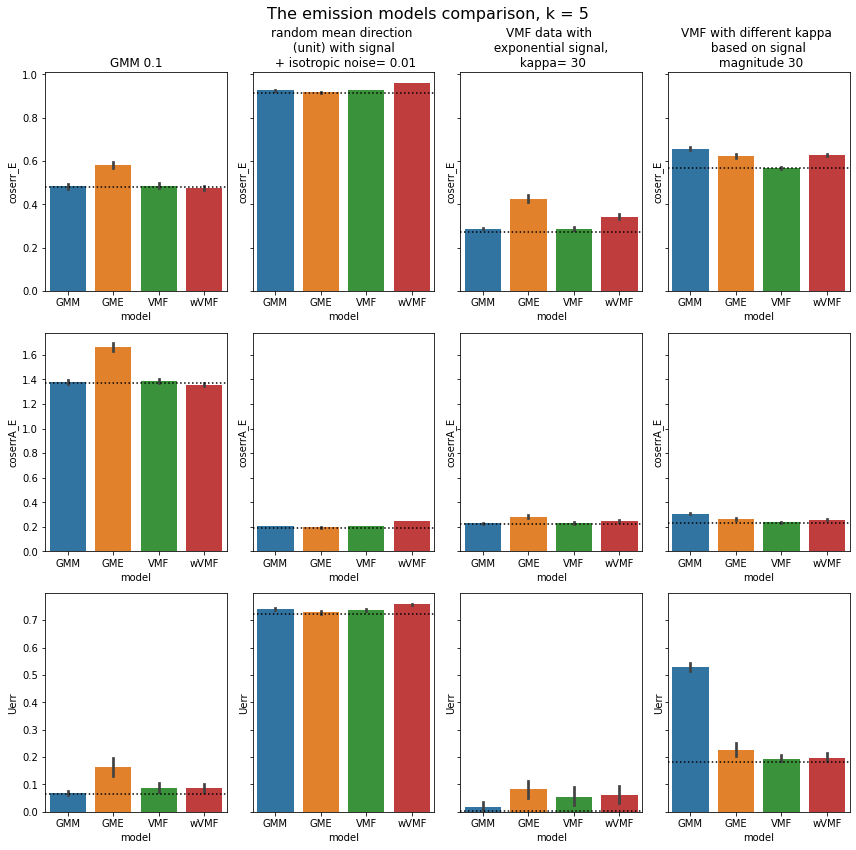

In [12]:
sys.path.append('D:\python_workspace\generativeMRF')
from generativeMRF.notebooks.test_emissions import do_full_comparison_emission, plot_comparision_emission

K = 5
T = do_full_comparison_emission(clusters=K, iters=50, P=1000, beta=1.5, subjs=1,
                                true_models=['GMM', 'GME', 'VMF', 'wVMF'],
                                disper=[0.1, 0.01, 30, 30], same_signal=True, missingdata=None)
plot_comparision_emission(T, K=K, dispersion=[0.1, 0.01, 30, 30])
plt.show()

In [57]:
from generativeMRF.notebooks.test_emissions import getData_from_T
import scipy.stats as spst

D1 = getData_from_T(T, crit='Uerr', true_model='GME', fit_model=['wVMF', 'VMF'], trim_locmin=False)
print(spst.ttest_rel(D1[0], D1[1]))

D2 = getData_from_T(T, crit='Uerr', true_model='wVMF', fit_model=['wVMF', 'VMF'], trim_locmin=False)
print(spst.ttest_rel(D2[0], D2[1]))

Ttest_relResult(statistic=1.1006561027738386, pvalue=0.2764241137274872)
Ttest_relResult(statistic=-1.0854640515635137, pvalue=0.28302770041460373)


### More data points: Simulation when kappa = 30 and 5000 data points

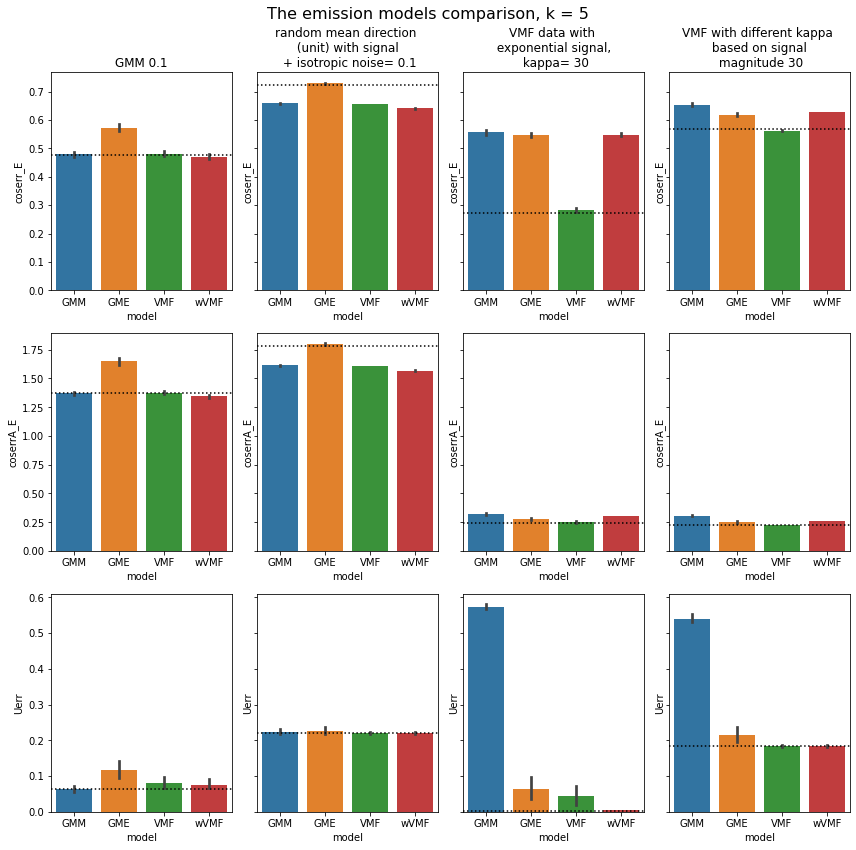

0.220316 0.22021999999999997 Ttest_relResult(statistic=0.6686702882404346, pvalue=0.5068438994342924)
0.18392399999999998 0.183496 Ttest_relResult(statistic=2.179490750321562, pvalue=0.034130778284558)


In [74]:
K = 5
T = do_full_comparison_emission(clusters=K, iters=50, P=5000, beta=1.5, subjs=1,
                                true_models=['GMM', 'GME', 'VMF', 'wVMF'],
                                disper=[0.1, 0.1, 30, 30], same_signal=True, missingdata=None)
plot_comparision_emission(T, K=K, dispersion=[0.1, 0.1, 30, 30])
plt.show()

D1 = getData_from_T(T, crit='Uerr', true_model='GME', fit_model=['wVMF', 'VMF'], trim_locmin=False)
print(D1[0].mean(), D1[1].mean(), spst.ttest_rel(D1[0], D1[1]))

D2 = getData_from_T(T, crit='Uerr', true_model='wVMF', fit_model=['wVMF', 'VMF'], trim_locmin=False)
print(D2[0].mean(), D2[1].mean(), spst.ttest_rel(D2[0], D2[1]))

In [75]:
D1 = getData_from_T(T, crit='Uerr', true_model='GME', fit_model=['wVMF', 'VMF'])
print(D1[0].mean(), D1[1].mean(), spst.ttest_rel(D1[0], D1[1]))

D2 = getData_from_T(T, crit='Uerr', true_model='wVMF', fit_model=['wVMF', 'VMF'])
print(D2[0].mean(), D2[1].mean(), spst.ttest_rel(D2[0], D2[1]))

0.21311612903225802 0.21334838709677414 Ttest_relResult(statistic=-1.507081077909954, pvalue=0.14224885927461897)
0.17719285714285718 0.1766642857142857 Ttest_relResult(statistic=2.571677773370577, pvalue=0.01594472431128139)


### More spread: Simulation when kappa = 18 and 5000 data points

In [76]:
from generativeMRF.notebooks.test_emissions import generate_data

# Step 1: Generate data by sampling from the above model
U = arrange.sample(num_subj=1)
Y1,_,_,U1,_ = generate_data('GMM', k=5, dim=3, p=5000, num_sub=1, dispersion=0.1,
                  beta=1.5, do_plot=False, same_signal=True, missingdata=None)
Y2,_,_,U2,_ = generate_data('GME', k=5, dim=3, p=5000, num_sub=1, dispersion=0.1,
                  beta=1.5, do_plot=False, same_signal=True, missingdata=None)
Y3,_,_,U3,_ = generate_data('VMF', k=5, dim=3, p=5000, num_sub=1, dispersion=18,
                  beta=1.5, do_plot=False, same_signal=True, missingdata=None)
Y4,_,_,U4,_ = generate_data('wVMF', k=5, dim=3, p=5000, num_sub=1, dispersion=18,
                  beta=1.5, do_plot=False, same_signal=True, missingdata=None)

fig = make_subplots(rows=1, cols=3, specs=[[{'type': 'surface'}, {'type': 'surface'}, {'type': 'surface'}]],
                    subplot_titles=["GME", "VMF", "wVMF"])

# fig.add_trace(go.Scatter3d(x=Y1[0, 0, :], y=Y1[0, 1, :], z=Y1[0, 2, :],
#                            mode='markers', marker=dict(size=3, opacity=0.7, color=U[0])), row=1, col=1)
fig.add_trace(go.Scatter3d(x=Y2[0, 0, :], y=Y2[0, 1, :], z=Y2[0, 2, :],
                           mode='markers', marker=dict(size=3, opacity=0.7, color=U2[0])), row=1, col=1)
fig.add_trace(go.Scatter3d(x=Y3[0, 0, :], y=Y3[0, 1, :], z=Y3[0, 2, :],
                           mode='markers', marker=dict(size=3, opacity=0.7, color=U3[0])), row=1, col=2)
fig.add_trace(go.Scatter3d(x=Y4[0, 0, :], y=Y4[0, 1, :], z=Y4[0, 2, :],
                           mode='markers', marker=dict(size=3, opacity=0.7, color=U4[0])), row=1, col=3)

fig.update_layout(title_text='Visualization of data generation')
fig.show()

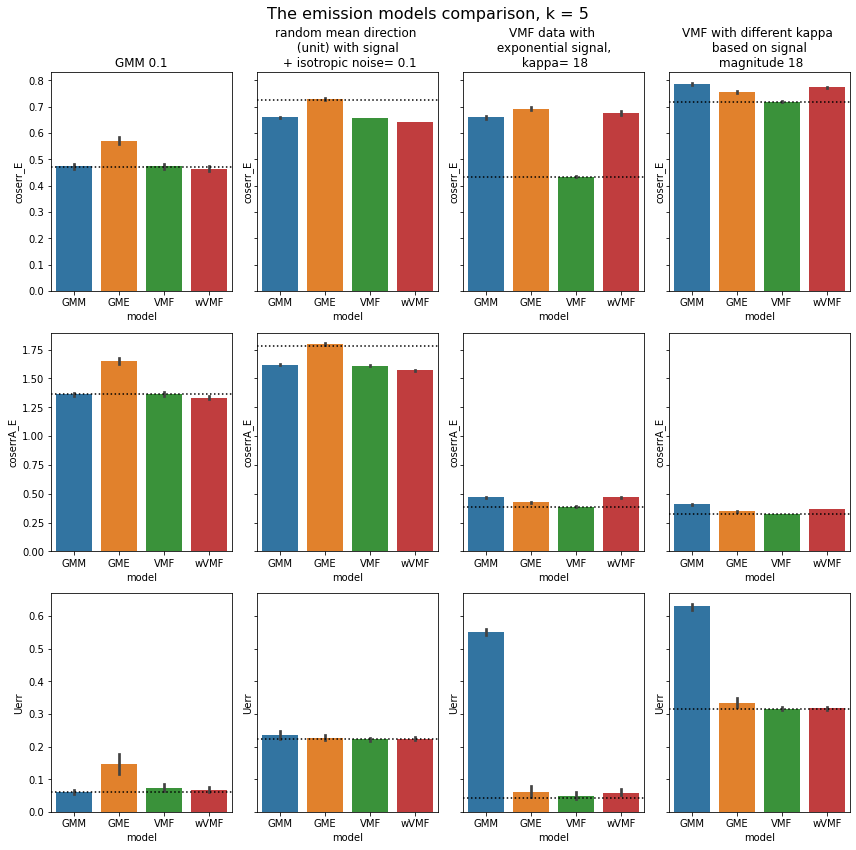

0.22332399999999997 0.22297999999999998 Ttest_relResult(statistic=2.3539342952297706, pvalue=0.022630043630008957)
0.31784 0.31610000000000005 Ttest_relResult(statistic=3.832311507654884, pvalue=0.00036215132532685325)


In [77]:
K = 5
T = do_full_comparison_emission(clusters=K, iters=50, P=5000, beta=1.5, subjs=1,
                                true_models=['GMM', 'GME', 'VMF', 'wVMF'],
                                disper=[0.1, 0.1, 18, 18], same_signal=True, missingdata=None)
plot_comparision_emission(T, K=K, dispersion=[0.1, 0.1, 18, 18])
plt.show()

D1 = getData_from_T(T, crit='Uerr', true_model='GME', fit_model=['wVMF', 'VMF'], trim_locmin=False)
print(D1[0].mean(), D1[1].mean(), spst.ttest_rel(D1[0], D1[1]))

D2 = getData_from_T(T, crit='Uerr', true_model='wVMF', fit_model=['wVMF', 'VMF'], trim_locmin=False)
print(D2[0].mean(), D2[1].mean(), spst.ttest_rel(D2[0], D2[1]))

In [71]:
D1 = getData_from_T(T, crit='Uerr', true_model='GME', fit_model=['wVMF', 'VMF'])
print(D1[0].mean(), D1[1].mean(), spst.ttest_rel(D1[0], D1[1]))

D2 = getData_from_T(T, crit='Uerr', true_model='wVMF', fit_model=['wVMF', 'VMF'])
print(D2[0].mean(), D2[1].mean(), spst.ttest_rel(D2[0], D2[1]))

0.20941428571428572 0.20935 Ttest_relResult(statistic=0.5170997019182411, pvalue=0.6092970195921903)
0.3081769230769231 0.30753846153846154 Ttest_relResult(statistic=1.6846412033963398, pvalue=0.1045034660285164)


### More concentrated: Simulation when kappa = 50 and 5000 data points

In [55]:
from generativeMRF.notebooks.test_emissions import generate_data

# Step 1: Generate data by sampling from the above model
U = arrange.sample(num_subj=1)
Y1,_,_,U1,_ = generate_data('GMM', k=5, dim=3, p=5000, num_sub=1, dispersion=0.1,
                  beta=1.5, do_plot=False, same_signal=True, missingdata=None)
Y2,_,_,U2,_ = generate_data('GME', k=5, dim=3, p=5000, num_sub=1, dispersion=0.1,
                  beta=1.5, do_plot=False, same_signal=True, missingdata=None)
Y3,_,_,U3,_ = generate_data('VMF', k=5, dim=3, p=5000, num_sub=1, dispersion=50,
                  beta=1.5, do_plot=False, same_signal=True, missingdata=None)
Y4,_,_,U4,_ = generate_data('wVMF', k=5, dim=3, p=5000, num_sub=1, dispersion=50,
                  beta=1.5, do_plot=False, same_signal=True, missingdata=None)

fig = make_subplots(rows=1, cols=3, specs=[[{'type': 'surface'}, {'type': 'surface'}, {'type': 'surface'}]],
                    subplot_titles=["GME", "VMF", "wVMF"])

# fig.add_trace(go.Scatter3d(x=Y1[0, 0, :], y=Y1[0, 1, :], z=Y1[0, 2, :],
#                            mode='markers', marker=dict(size=3, opacity=0.7, color=U[0])), row=1, col=1)
fig.add_trace(go.Scatter3d(x=Y2[0, 0, :], y=Y2[0, 1, :], z=Y2[0, 2, :],
                           mode='markers', marker=dict(size=3, opacity=0.7, color=U2[0])), row=1, col=1)
fig.add_trace(go.Scatter3d(x=Y3[0, 0, :], y=Y3[0, 1, :], z=Y3[0, 2, :],
                           mode='markers', marker=dict(size=3, opacity=0.7, color=U3[0])), row=1, col=2)
fig.add_trace(go.Scatter3d(x=Y4[0, 0, :], y=Y4[0, 1, :], z=Y4[0, 2, :],
                           mode='markers', marker=dict(size=3, opacity=0.7, color=U4[0])), row=1, col=3)

fig.update_layout(title_text='Visualization of data generation')
fig.show()

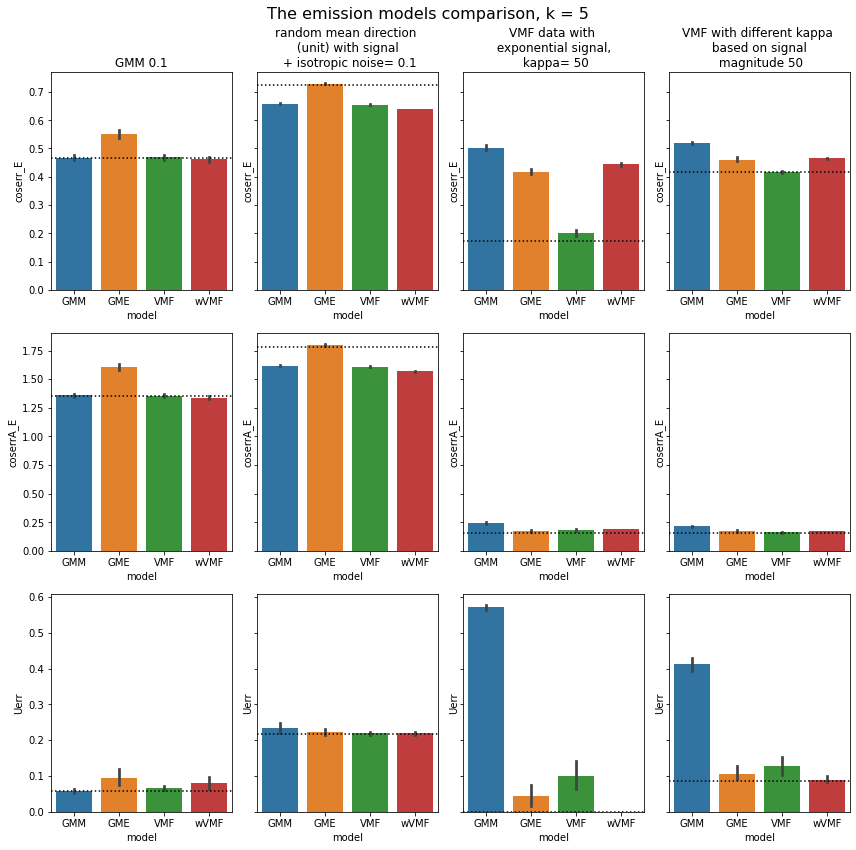

Ttest_relResult(statistic=1.9948005439545395, pvalue=0.05164234897153923)
Ttest_relResult(statistic=-2.5835552550092085, pvalue=0.012812789431068406)


In [61]:
K = 5
T = do_full_comparison_emission(clusters=K, iters=50, P=5000, beta=1.5, subjs=1,
                                true_models=['GMM', 'GME', 'VMF', 'wVMF'],
                                disper=[0.1, 0.1, 50, 50], same_signal=True, missingdata=None)
plot_comparision_emission(T, K=K, dispersion=[0.1, 0.1, 50, 50])
plt.show()

D1 = getData_from_T(T, crit='Uerr', true_model='GME', fit_model=['wVMF', 'VMF'], trim_locmin=False)
print(D1[0].mean(), D1[1].mean(), spst.ttest_rel(D1[0], D1[1]))

D2 = getData_from_T(T, crit='Uerr', true_model='wVMF', fit_model=['wVMF', 'VMF'], trim_locmin=False)
print(D2[0].mean(), D2[1].mean(), spst.ttest_rel(D2[0], D2[1]))

## Simplified and break down the question

Please forget of above and let's focus on a simple case. By visualizing the distribution of data magnitude from the real data, we have a good intuition that the signal strength is like a skewed normal. However, we don't know what is the ground truth. So for simplicity, we just consider an extreme situation, where a large portion of the data have no magnitude at all while the rest of the data have the true magnitude, such as 80% - 0; 20% - 1.

And to further simplify the question and break it down. Let's only consider the data generating model is "GME" (actually not GME but a random mean direction with signal strength + isotropic noise). 

In [10]:
import generativeMRF.arrangements as ar
import generativeMRF.emissions as em
import generativeMRF.full_model as fm
import generativeMRF.evaluation as ev
import seaborn as sb
import torch as pt

sys.path.append('D:\python_workspace\generativeMRF')
from generativeMRF.notebooks.test_emissions import generate_data

# Step 1: Generate data by sampling from the above model
Y2,_,_,U2,_ = generate_data('GME', k=5, dim=3, p=5000, num_sub=1, dispersion=0.05,
                  beta=1.0, do_plot=False, same_signal=True, missingdata=None)

fig = make_subplots(rows=1, cols=1, specs=[[{'type': 'surface'}]],
                    subplot_titles=["GME"])

# fig.add_trace(go.Scatter3d(x=Y1[0, 0, :], y=Y1[0, 1, :], z=Y1[0, 2, :],
#                            mode='markers', marker=dict(size=3, opacity=0.7, color=U[0])), row=1, col=1)
fig.add_trace(go.Scatter3d(x=Y2[0, 0, :], y=Y2[0, 1, :], z=Y2[0, 2, :],
                           mode='markers', marker=dict(size=3, opacity=0.7, color=U2[0])), row=1, col=1)

fig.update_layout(title_text='Visualization of data generation')
fig.show()

### Visualize the signal strengths distribution

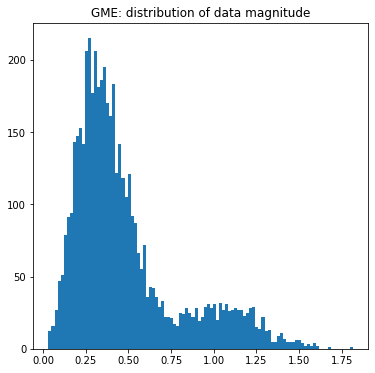

In [11]:
plt.figure(figsize=(6,6))

plt.hist(pt.norm(Y2, dim=1).reshape(-1).numpy(), bins=100)
plt.title('GME: distribution of data magnitude')

plt.show()

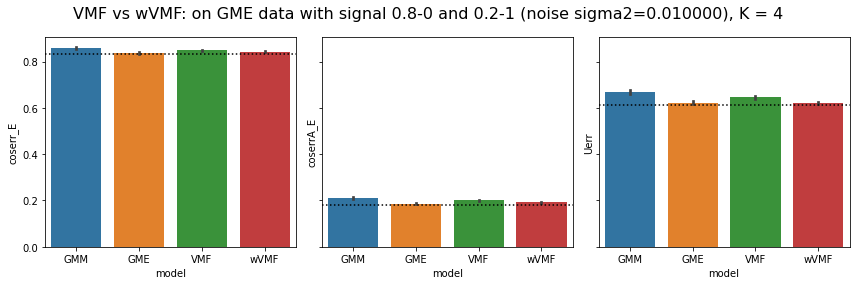

In [14]:
from generativeMRF.notebooks.test_emissions import do_full_comparison_emission, plot_comparision_VMF_wVMF

T = do_full_comparison_emission(clusters=K, iters=50, P=5000, beta=1.0, subjs=1,
                                    true_models=['GME'], disper=[0.01],
                                    same_signal=True, missingdata=None)
plot_comparision_VMF_wVMF(T, K=K, dispersion=0.01)
plt.show()

In [15]:
from generativeMRF.notebooks.test_emissions import getData_from_T
import scipy.stats as spst

D1 = getData_from_T(T, crit='coserrA_E', true_model='GME', fit_model=['VMF', 'wVMF'], trim_locmin=False)
print(D1[0].mean(), D1[1].mean(), spst.ttest_rel(D1[0], D1[1]))

D2 = getData_from_T(T, crit='Uerr', true_model='GME', fit_model=['VMF', 'wVMF'], trim_locmin=False)
print(D2[0].mean(), D2[1].mean(), spst.ttest_rel(D2[0], D2[1]))

0.20098099555230406 0.19297787254538393 Ttest_relResult(statistic=5.0295476366994825, pvalue=6.989931057687777e-06)
0.6458919999999999 0.621224 Ttest_relResult(statistic=6.696147601381085, pvalue=1.961557358968145e-08)


### Making signal more strength: 80% - 0s; 2% - 1.5s

In [16]:
Y2,_,_,U2,_ = generate_data('GME', k=5, dim=3, p=5000, num_sub=1, dispersion=0.01,
                  beta=1.5, do_plot=False, same_signal=True, missingdata=None)

fig = make_subplots(rows=1, cols=1, specs=[[{'type': 'surface'}]],
                    subplot_titles=["GME"])

# fig.add_trace(go.Scatter3d(x=Y1[0, 0, :], y=Y1[0, 1, :], z=Y1[0, 2, :],
#                            mode='markers', marker=dict(size=3, opacity=0.7, color=U[0])), row=1, col=1)
fig.add_trace(go.Scatter3d(x=Y2[0, 0, :], y=Y2[0, 1, :], z=Y2[0, 2, :],
                           mode='markers', marker=dict(size=3, opacity=0.7, color=U2[0])), row=1, col=1)

fig.update_layout(title_text='Visualization of data generation')
fig.show()

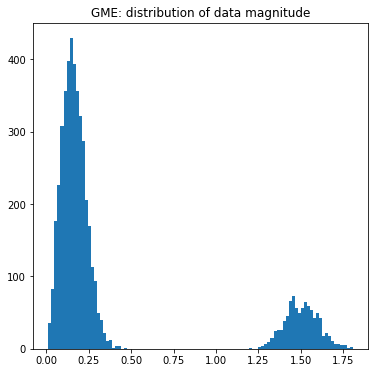

In [17]:
plt.figure(figsize=(6,6))

plt.hist(pt.norm(Y2, dim=1).reshape(-1).numpy(), bins=100)
plt.title('GME: distribution of data magnitude')

plt.show()

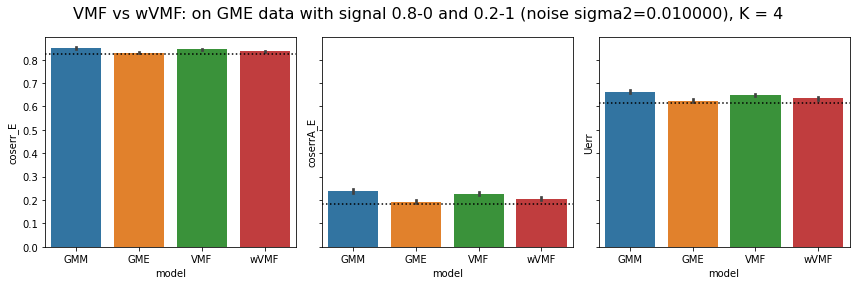

In [18]:
T = do_full_comparison_emission(clusters=K, iters=50, P=5000, beta=1.5, subjs=1,
                                    true_models=['GME'], disper=[0.01],
                                    same_signal=True, missingdata=None)
plot_comparision_VMF_wVMF(T, K=K, dispersion=0.01)
plt.show()

In [19]:
D1 = getData_from_T(T, crit='coserrA_E', true_model='GME', fit_model=['VMF', 'wVMF'], trim_locmin=False)
print(D1[0].mean(), D1[1].mean(), spst.ttest_rel(D1[0], D1[1]))

D2 = getData_from_T(T, crit='Uerr', true_model='GME', fit_model=['VMF', 'wVMF'], trim_locmin=False)
print(D2[0].mean(), D2[1].mean(), spst.ttest_rel(D2[0], D2[1]))

0.226456431780565 0.20502187322445667 Ttest_relResult(statistic=5.039072785580177, pvalue=6.76485578945933e-06)
0.6482439999999999 0.6354679999999999 Ttest_relResult(statistic=3.262264271343603, pvalue=0.0020163510915066378)


### Repeat above experiment ~ 80% -0 and 20% -0.5

In [22]:
Y2,_,_,U2,_ = generate_data('GME', k=5, dim=3, p=5000, num_sub=1, dispersion=0.01,
                  beta=0.5, do_plot=False, same_signal=True, missingdata=None)

fig = make_subplots(rows=1, cols=1, specs=[[{'type': 'surface'}]],
                    subplot_titles=["GME"])

# fig.add_trace(go.Scatter3d(x=Y1[0, 0, :], y=Y1[0, 1, :], z=Y1[0, 2, :],
#                            mode='markers', marker=dict(size=3, opacity=0.7, color=U[0])), row=1, col=1)
fig.add_trace(go.Scatter3d(x=Y2[0, 0, :], y=Y2[0, 1, :], z=Y2[0, 2, :],
                           mode='markers', marker=dict(size=3, opacity=0.7, color=U2[0])), row=1, col=1)

fig.update_layout(title_text='Visualization of data generation')
fig.show()

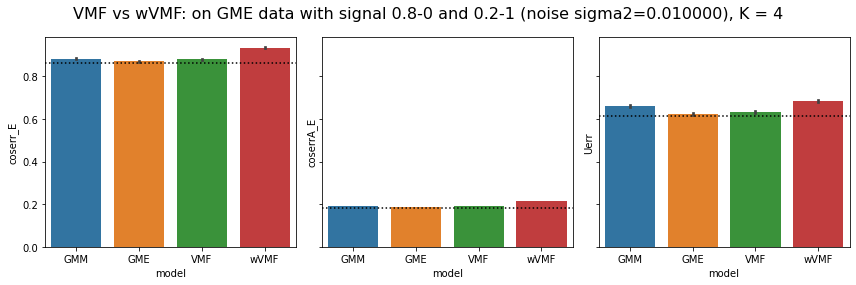

0.19088575585322648 0.21550515548313395 Ttest_relResult(statistic=-24.144805496799144, pvalue=7.313944378349413e-29)
0.6323960000000001 0.6847 Ttest_relResult(statistic=-12.625340764878215, pvalue=5.094476584342358e-17)


In [23]:
T = do_full_comparison_emission(clusters=K, iters=50, P=5000, beta=0.5, subjs=1,
                                    true_models=['GME'], disper=[0.01],
                                    same_signal=True, missingdata=None)
plot_comparision_VMF_wVMF(T, K=K, dispersion=0.01)
plt.show()

D1 = getData_from_T(T, crit='coserrA_E', true_model='GME', fit_model=['VMF', 'wVMF'], trim_locmin=False)
print(D1[0].mean(), D1[1].mean(), spst.ttest_rel(D1[0], D1[1]))

D2 = getData_from_T(T, crit='Uerr', true_model='GME', fit_model=['VMF', 'wVMF'], trim_locmin=False)
print(D2[0].mean(), D2[1].mean(), spst.ttest_rel(D2[0], D2[1]))

### Repeat above experiment ~ 80% -0 and 20% -3

In [24]:
Y2,_,_,U2,_ = generate_data('GME', k=5, dim=3, p=5000, num_sub=1, dispersion=0.01,
                  beta=3.0, do_plot=False, same_signal=True, missingdata=None)

fig = make_subplots(rows=1, cols=1, specs=[[{'type': 'surface'}]],
                    subplot_titles=["GME"])

# fig.add_trace(go.Scatter3d(x=Y1[0, 0, :], y=Y1[0, 1, :], z=Y1[0, 2, :],
#                            mode='markers', marker=dict(size=3, opacity=0.7, color=U[0])), row=1, col=1)
fig.add_trace(go.Scatter3d(x=Y2[0, 0, :], y=Y2[0, 1, :], z=Y2[0, 2, :],
                           mode='markers', marker=dict(size=3, opacity=0.7, color=U2[0])), row=1, col=1)

fig.update_layout(title_text='Visualization of data generation')
fig.show()

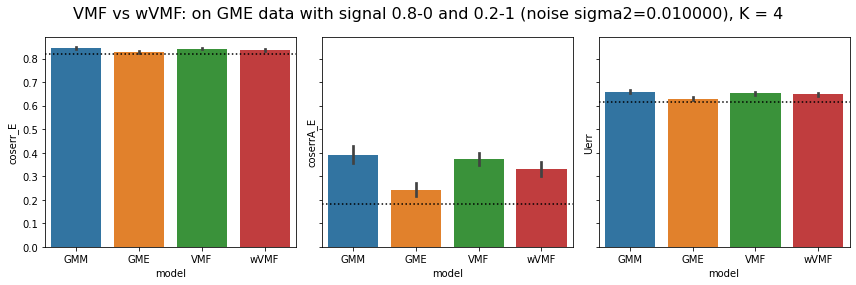

0.37356485862180233 0.3301213614133035 Ttest_relResult(statistic=2.0880006361572416, pvalue=0.042017838631442095)
0.651968 0.648112 Ttest_relResult(statistic=0.8818519149994508, pvalue=0.3821624386046044)


In [25]:
T = do_full_comparison_emission(clusters=K, iters=50, P=5000, beta=3.0, subjs=1,
                                    true_models=['GME'], disper=[0.01],
                                    same_signal=True, missingdata=None)
plot_comparision_VMF_wVMF(T, K=K, dispersion=0.01)
plt.show()

D1 = getData_from_T(T, crit='coserrA_E', true_model='GME', fit_model=['VMF', 'wVMF'], trim_locmin=False)
print(D1[0].mean(), D1[1].mean(), spst.ttest_rel(D1[0], D1[1]))

D2 = getData_from_T(T, crit='Uerr', true_model='GME', fit_model=['VMF', 'wVMF'], trim_locmin=False)
print(D2[0].mean(), D2[1].mean(), spst.ttest_rel(D2[0], D2[1]))